In [135]:

import os
import cv2
import numpy as np
import pandas as pd
from pytube import YouTube
from scipy.io import loadmat
from multiprocessing import Pool
from PIL import Image

repo_dir = "c:/Users/James/git/3dGolfPoseDetection/"
download_path = repo_dir + 'downloaded-data/videos/'

if not os.path.exists(download_path):
    os.makedirs(download_path)

#Reusing some code from wmcnally/golfdb, thank you very much for the labels :)

#input file golfDB.mat

In [121]:
x = loadmat('golfDB.mat')
l = list(x['golfDB'][0])
d = dict()
for idx, k in enumerate(l):
    d["{:3d}".format(idx)] = list(l[idx])
df = pd.DataFrame(d).T
df.columns = ["id","youtube_id","player", "sex", "club","view","slow","events","bbox","split"]
df = df.drop(columns=['id', 'sex', 'club', 'view', 'slow', 'split'])
for col in ['youtube_id', 'player', 'events', 'bbox']:
    df[col] = df[col].apply(lambda x: x[0])

# Group Rows on 'youtube_id' going from 1400 to 580 aggregated rows (i.e. multiple events per video)
df = df.groupby('youtube_id').agg({"player": lambda x: list(x)[0],
                                   "events": lambda x: list(x),
                                   "bbox": lambda x: list(x)})
df = df.sort_values(by=['player'], ascending=True)
df.reset_index(inplace=True)
df.head()

,youtube_id,player,events,bbox
0,XwnbLuQSLuY,ADAM SCOTT,"[[721, 783, 794, 798, 805, 810, 813, 815, 838,...","[[0.109375, 0.0006944444444444445, 0.54609375,..."
1,jbB8LaUIq1c,ADAM SCOTT,"[[1414, 1725, 1736, 1740, 1748, 1752, 1755, 17...","[[0.07187500000000002, 0.0006944444444444445, ..."
2,t-DfeLMz6Rc,ADAM SCOTT,"[[815, 1251, 1265, 1268, 1277, 1282, 1285, 128...","[[0.000390625, 0.0006944444444444445, 0.598828..."
3,AmJx1lu1fv8,ADAM SCOTT,"[[871, 1222, 1236, 1239, 1248, 1253, 1255, 125...","[[0.50078125, 0.0006944444444444445, 0.4996093..."
4,1yBqlMwG8Lw,ADAM SCOTT,"[[391, 508, 520, 524, 531, 536, 539, 541, 561,...","[[0.5234375, 0.0006944444444444445, 0.384375, ..."


In [128]:
youtube_base_url = 'https://www.youtube.com/watch?v='

def download_video(url, video_path):
    if not os.path.exists(video_path):
        os.makedirs(video_path)

    yt = YouTube(url)
    yt = yt.streams.filter(progressive=True, file_extension='mp4').order_by('resolution').desc().first()
    yt.download(video_path)

for index, row in df.iterrows():

    url = youtube_base_url+row['youtube_id']
    video_path = download_path + f'{index}/'
    try:
        download_video(url, video_path)
    except Exception as e:
        print(f"Skipping video index {index} | {url}", e)

    if index == 1:
        break


Skipping video index 1 | https://www.youtube.com/watch?v=jbB8LaUIq1c 'streamingData'


In [129]:
video_path

'c:/Users/James/git/3dGolfPoseDetection/downloaded-data/videos/1/'

In [152]:
for events, bbox in zip(row['events'], row['bbox']):
    print(events, bbox)

[1414 1725 1736 1740 1748 1752 1755 1757 1776 1808] [7.18750000e-02 6.94444444e-04 8.04687500e-01 9.75694444e-01]
[2078 2109 2155 2171 2202 2220 2232 2239 2303 2335] [9.53125000e-02 6.94444444e-04 7.63281250e-01 9.90972222e-01]


In [157]:
video_filepath = video_path+os.listdir(video_path)[0]
cap = cv2.VideoCapture(video_filepath)
x = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH) * bbox[0])
y = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT) * bbox[1])
w = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH) * bbox[2])
h = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT) * bbox[3])
count = 0
success, image = cap.read()
images = []
while success:
    count += 1
    if count > events[-1]:
        break
    if count in events:
        crop_img = image[y:y + h, x:x + w]
        images.append(crop_img)
    # if count >= events[0]:
    #     crop_img = image[y:y + h, x:x + w]
    #     crop_size = crop_img.shape[:2]
    #     ratio = dim / max(crop_size)
    #     new_size = tuple([int(x*ratio) for x in crop_size])
    #     resized = cv2.resize(crop_img, (new_size[1], new_size[0]))
    #     delta_w = dim - new_size[1]
    #     delta_h = dim - new_size[0]
    #     top, bottom = delta_h // 2, delta_h - (delta_h // 2)
    #     left, right = delta_w // 2, delta_w - (delta_w // 2)
    #     b_img = cv2.copyMakeBorder(resized, top, bottom, left, right, cv2.BORDER_CONSTANT,
    #                                 value=[0.406*255, 0.456*255, 0.485*255])  # ImageNet means (BGR)
    #     out.write(b_img)


    success, image = cap.read()

In [160]:
crop_img.shape

(713, 977, 3)

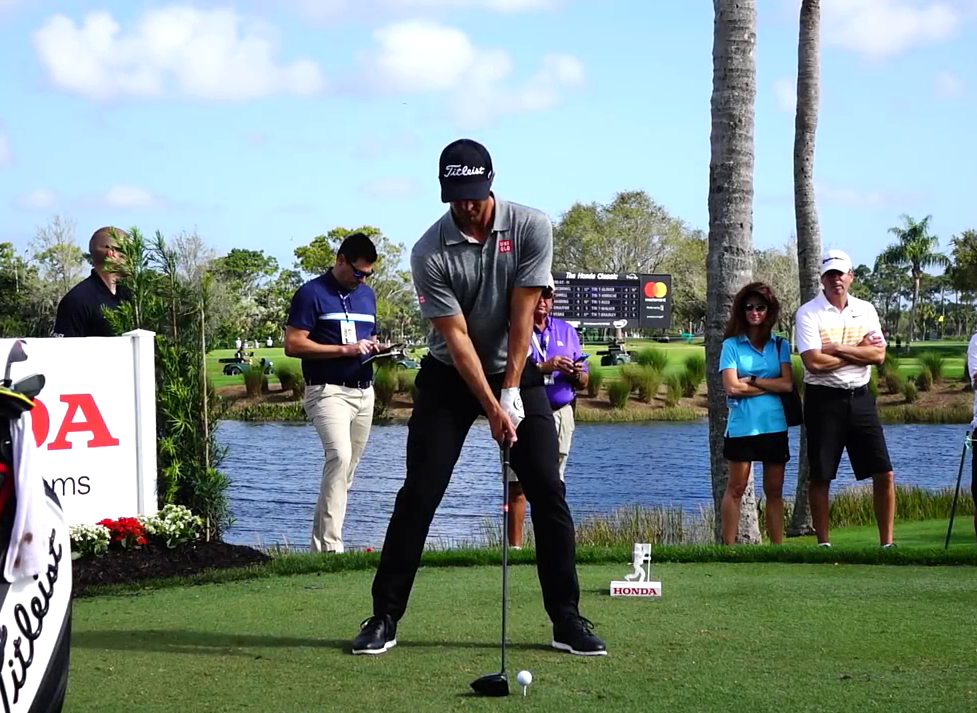

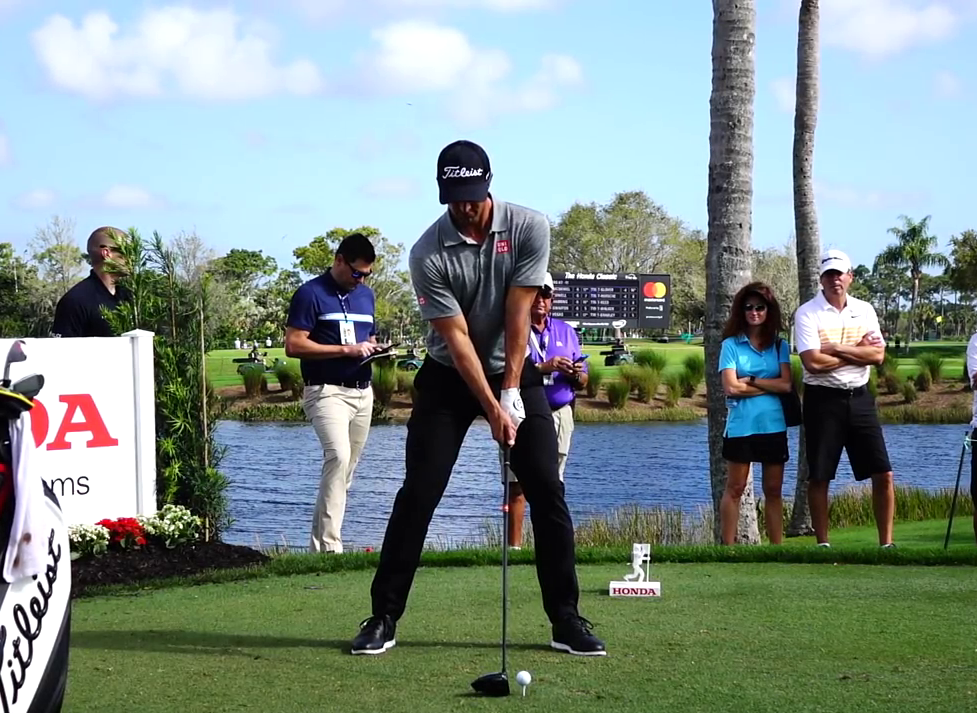

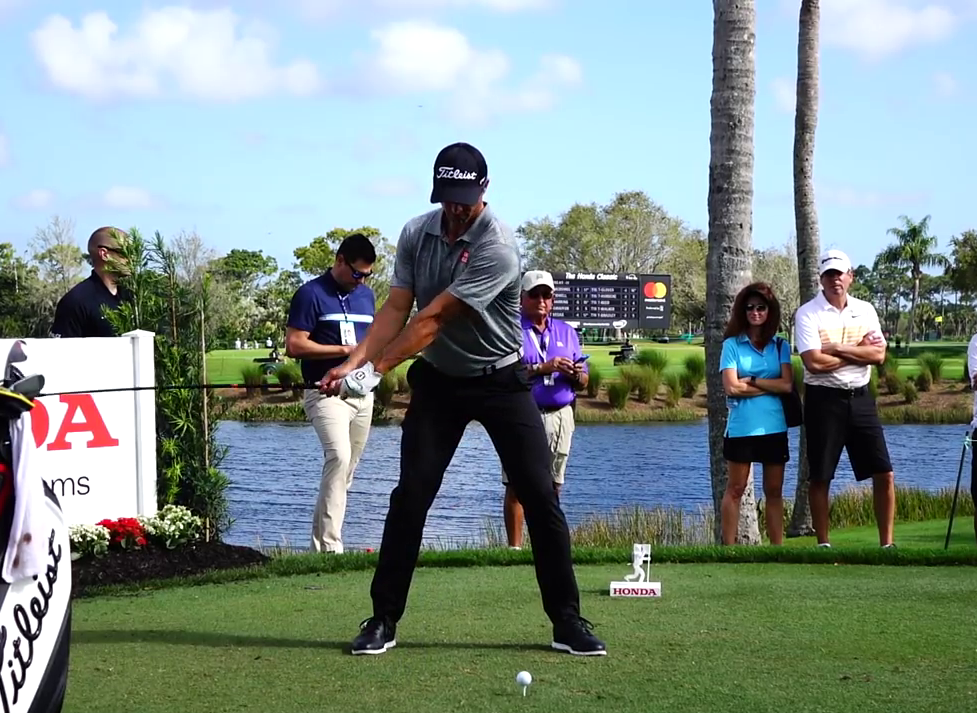

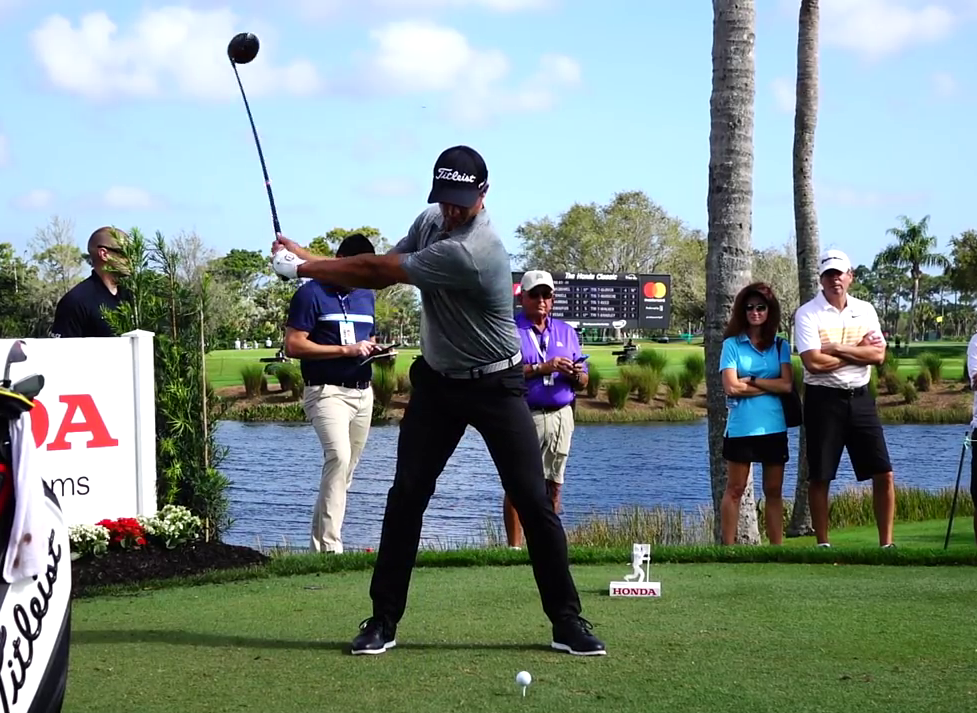

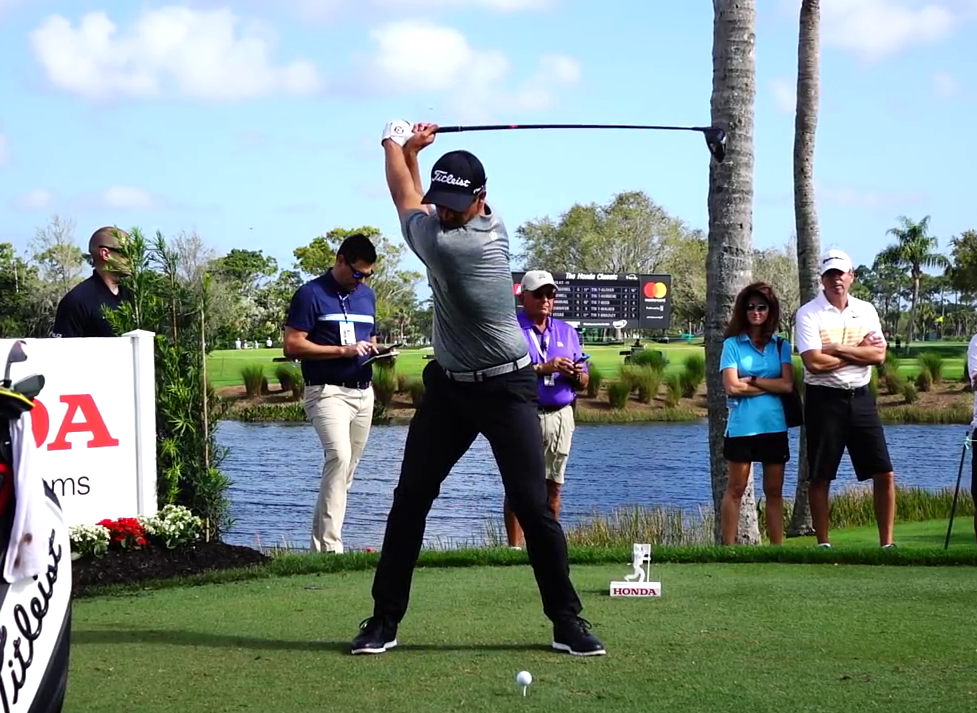

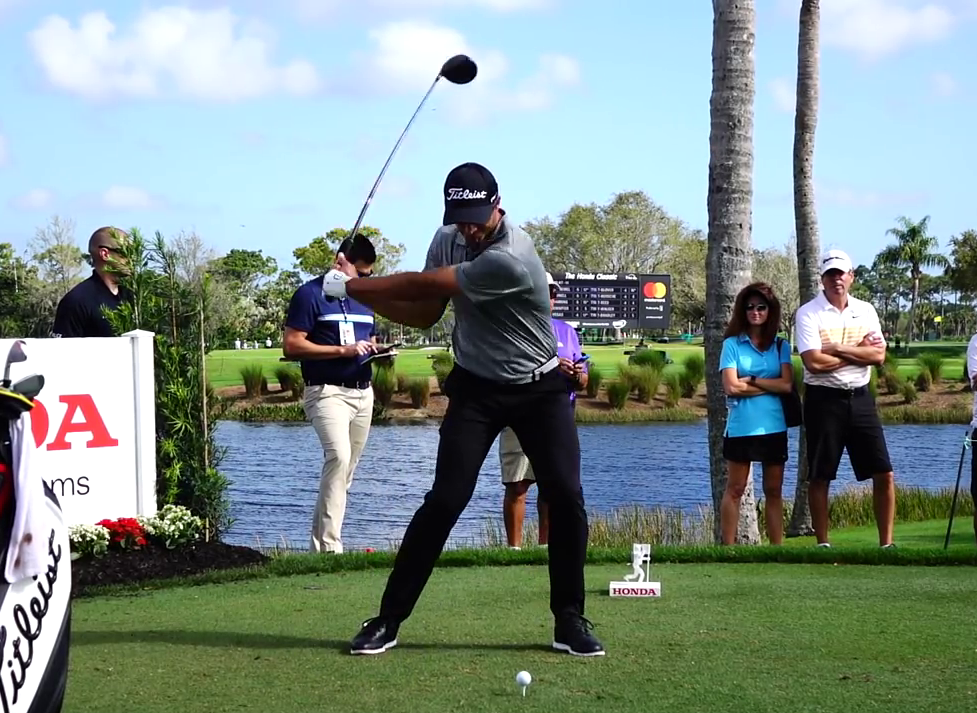

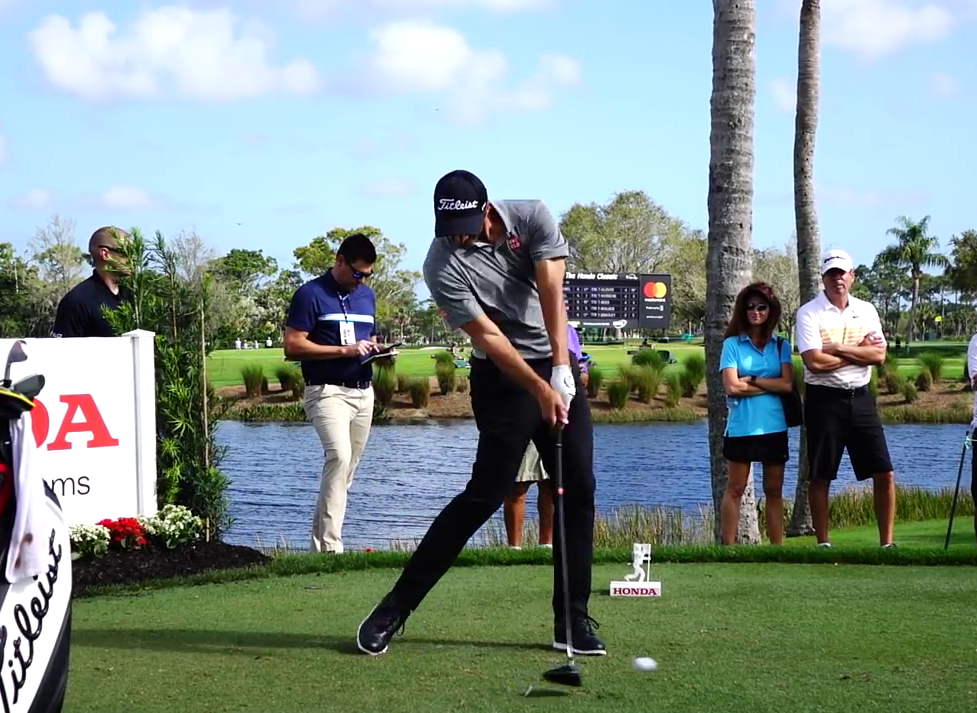

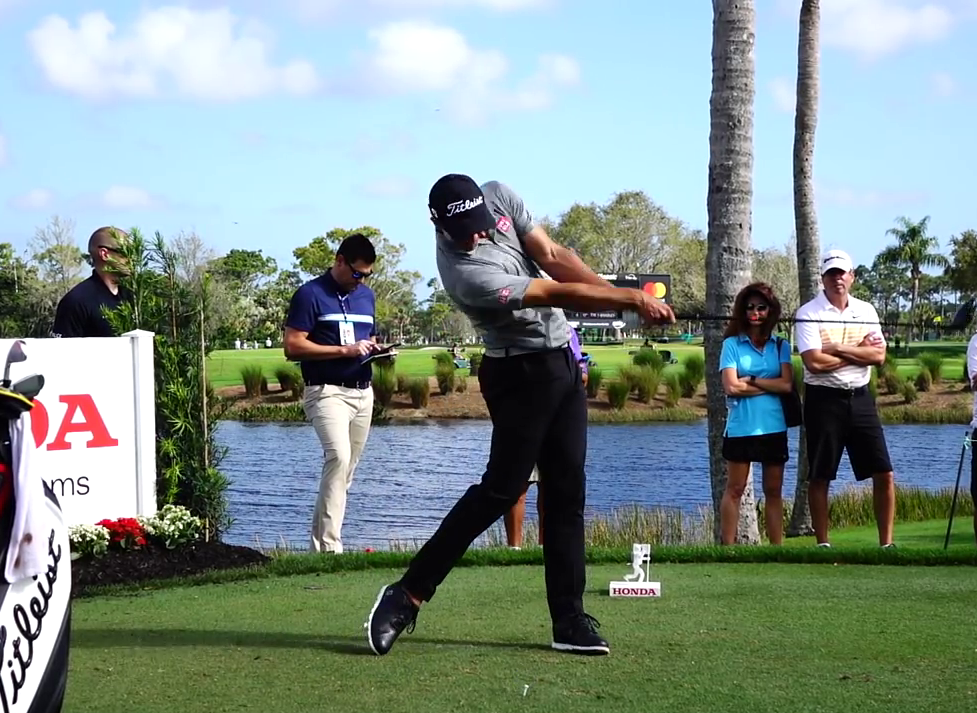

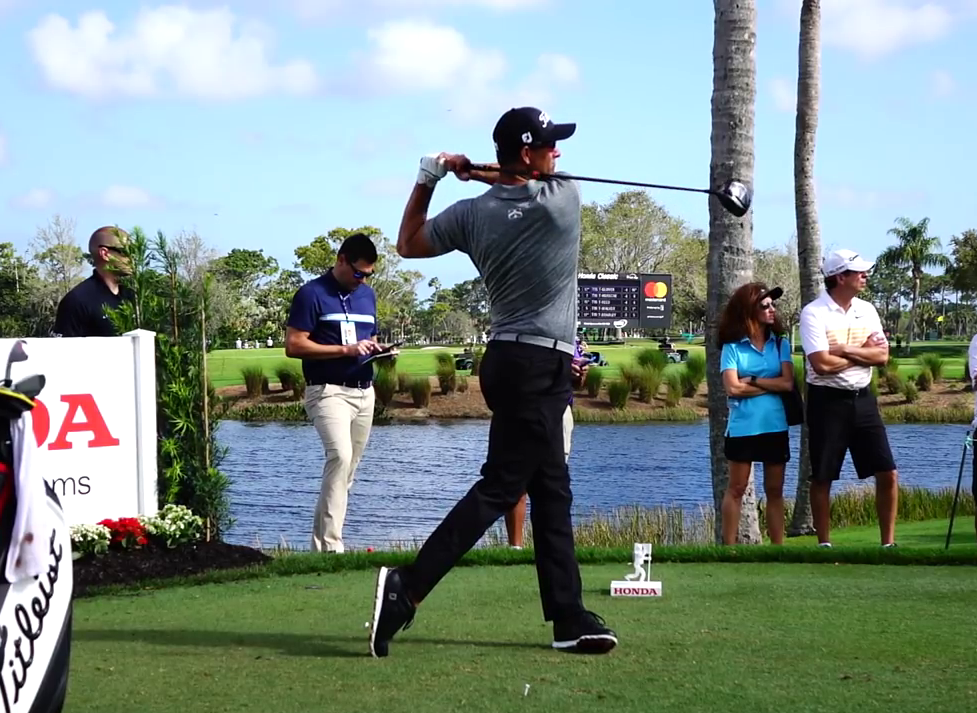

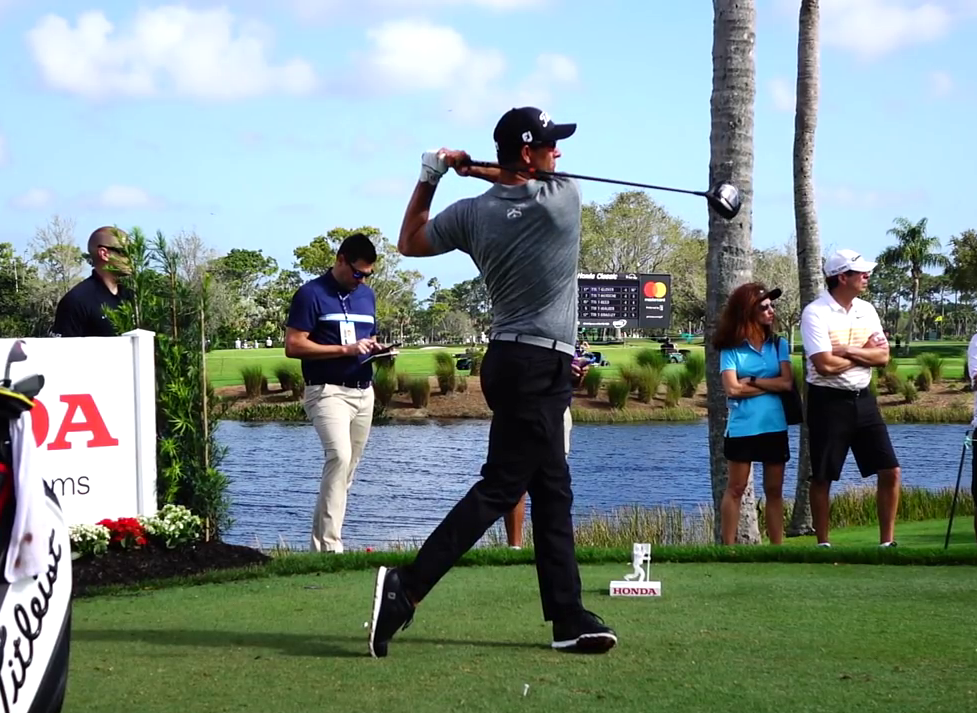

In [159]:
for crop_img in images:
    display(Image.fromarray(crop_img[:, :, ::-1]))

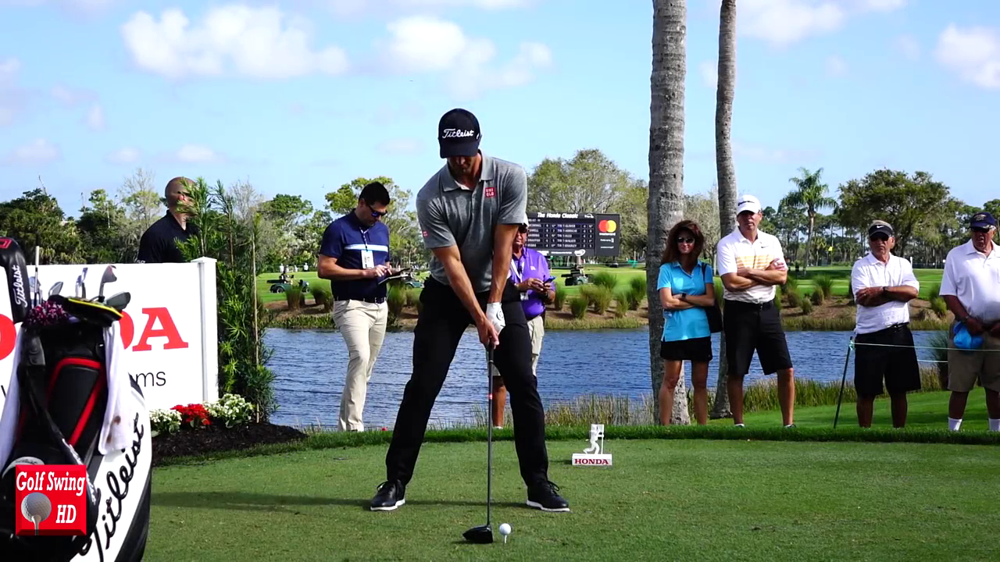

In [156]:
Image.fromarray(image[:, :, ::-1])

In [161]:

# crop_size = crop_img.shape[:2]
# ratio = dim / max(crop_size)
# new_size = tuple([int(x*ratio) for x in crop_size])
# resized = cv2.resize(crop_img, (new_size[1], new_size[0]))
# delta_w = dim - new_size[1]
# delta_h = dim - new_size[0]
# top, bottom = delta_h // 2, delta_h - (delta_h // 2)
# left, right = delta_w // 2, delta_w - (delta_w // 2)
# b_img = cv2.copyMakeBorder(resized, top, bottom, left, right, cv2.BORDER_CONSTANT,
#                             value=[0.406*255, 0.456*255, 0.485*255])  # ImageNet means (BGR)